<a href="https://www.kaggle.com/code/youneseloiarm/mitsui-dataset-overview-visualization-python?scriptVersionId=292033272" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# Load packages
# In Python, we typically install packages via pip/conda in the terminal, not in the notebook
# You would run these in your terminal first:
# pip install numpy pandas matplotlib seaborn networkx
!pip install pyvis
# Core Data Processing
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Network Analysis
import networkx as nx
from pyvis.network import Network

# Statistics
import scipy.stats as stats
from scipy.stats import norm

# Utilities
import random
import re
import warnings

# Set global configurations
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
plt.style.use('seaborn')
sns.set_palette('muted')
# For Jupyter notebooks
%matplotlib inline
from IPython.display import display
# Function similar to your figsize()
def figsize(width, height):
    plt.rcParams['figure.figsize'] = (width, height)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 10.5 MB/s eta 0:00:00




---

I’d like to thank and give credit to **@negoto** for the beautifully crafted R notebook titled [*"Mitsui: Dataset Overview & Visualization"*](https://www.kaggle.com/code/negoto/mitsui-dataset-overview-visualization/notebook).

Since the majority of the Kaggle community uses Python, I’ve recreated the notebook in Python to make it more accessible.

Please don’t forget to **upvote the original R notebook** — it’s a great resource and deserves recognition!

---





# Overview

This notebook performs an initial Exploratory Data Analysis (EDA) of the datasets for the Mitsui & Co. Commodity Prediction Challenge with **R**.

# Historical Prices

The `train.csv` and `test.csv` contain 558 and 559 columns, respectively. The first column is `date_id`, a time-series identifier, and the last column of `test.csv` is `is_scored`. The remaining 557 columns represent **historical price features** from four main categories: **LME**, **JPX**, **US Stock** and **Forex**.

---
**Category 1: London Metal Exchange (LME)**  
Official Website: [lme.com](https://www.lme.com/)

This category includes 4 columns representing the closing prices of four industrial metals:
- AH ([Alminium](https://www.lme.com/en/Metals/Non-ferrous/LME-Aluminium#Price+graphs))
- CA ([Copper](https://www.lme.com/Metals/Non-ferrous/LME-Copper#Price+graphs))
- PB ([Lead](https://www.lme.com/en/Metals/Non-ferrous/LME-Lead#Price+graphs))
- ZS ([Zinc](https://www.lme.com/en/Metals/Non-ferrous/LME-Zinc#Price+graphs))
---  
**Category 2: Japan Exchange Group (JPX)**  
Official Website: jpx.co.jp ([English](https://www.jpx.co.jp/english/index.html), [Japanese](https://www.jpx.co.jp/index.html))

This category consists of 40 columns covering six commodity-related futures:

  - [Gold Mini Futures](https://www.jpx.co.jp/english/derivatives/products/precious-metals/gold-mini-futures/index.html) ([金ミニ先物](https://www.jpx.co.jp/derivatives/products/precious-metals/gold-mini-futures/index.html))
  - [Gold Rolling Spot Futures](https://www.jpx.co.jp/english/derivatives/products/precious-metals/gold-rolling-spot-futures/index.html) ([金限日先物](https://www.jpx.co.jp/derivatives/products/precious-metals/gold-rolling-spot-futures/index.html))
  - [Gold Standard Futures](https://www.jpx.co.jp/english/derivatives/products/precious-metals/gold-standard-futures/index.html) ([金標準先物](https://www.jpx.co.jp/derivatives/products/precious-metals/gold-standard-futures/index.html))
  - [Platinum Mini Futures](https://www.jpx.co.jp/english/derivatives/products/precious-metals/platinum-mini-futures/index.html) ([白金ミニ先物](https://www.jpx.co.jp/derivatives/products/precious-metals/platinum-mini-futures/index.html))
  - [Platinum Standard Futures](https://www.jpx.co.jp/english/derivatives/products/precious-metals/platinum-standard-futures/index.html) ([白金標準先物](https://www.jpx.co.jp/derivatives/products/precious-metals/platinum-standard-futures/index.html))
  - [RSS3 Rubber Futures](https://www.jpx.co.jp/english/derivatives/products/rubber/rss3-rubber-futures/index.html) ([ゴム（RSS3）先物](https://www.jpx.co.jp/derivatives/products/rubber/rss3-rubber-futures/index.html))

For each future, the dataset includes features such as Open, High, Low, Close, Volume, Settlement Price, and Open Interest.

---
**Category 3: US Stocks**  
Official Exchanges: [nyse.com](https://www.nyse.com/index) (NYSE), [nasdaq.com](https://www.nasdaq.com/) (NASDAQ)

This category contains 475 columns for 95 selected stocks and ETFs that are closely related to commodity prices, e.g.:

- Stock
  - PAAS ([Pan American Silver Corp. Common Stock](https://www.nasdaq.com/market-activity/stocks/paas))
  - NEM ([Newmont Corporation](https://www.nyse.com/quote/XNYS:NEM))
  - GOLD ([Barrick Gold Corporation](https://www.nyse.com/quote/XNYS:GOLD))
  - SLB ([SLB (Schlumberger Limited)](https://www.nyse.com/quote/XNYS:SLB))
  - ALB ([Albemarle Corporation](https://www.nyse.com/quote/XNYS:ALB))
- ETF
  - GLD ([SPDR GOLD TRUST GOLD SHARES NPV](https://www.nyse.com/quote/ARCX:GLD))
  - IAU ([ISHARES GOLD TRUST ISHARES NEW (POST REV SPLIT)](https://www.nyse.com/quote/ARCX:IAU))
  - SLV ([ISHARES SILVER TRUST ISHARES](https://www.nyse.com/quote/ARCX:SLV))
  - URA ([GLOBAL X FDS URANIUM ETF USD](https://www.nyse.com/quote/ARCX:URA))
  - OIH ([VanEck Oil Services ETF](https://www.nyse.com/quote/ARCX:OIH))

For each ticker, the dataset contains 5 features: adjusted Open, High, Low, Close, and Volume.

---
**Source 4: Foreign Exchange (Forex)**

This category includes 38 columns representing foreign exchange rates among 10 major currencies:

- CAD ([Canadian dollar](https://en.wikipedia.org/wiki/Canadian_dollar))
- CHF ([Swiss franc](https://en.wikipedia.org/wiki/Swiss_franc))
- EUR ([Euro](https://en.wikipedia.org/wiki/Euro))
- GBP ([Pound Sterling](https://en.wikipedia.org/wiki/Sterling_(currency)))
- NZD ([New Zealand dollar](https://en.wikipedia.org/wiki/New_Zealand_dollar))
- USD ([United States dollar](https://en.wikipedia.org/wiki/United_States_dollar))
- ZAR ([South African rand](https://en.wikipedia.org/wiki/South_African_rand))
- NOK ([Norwegian krone](https://en.wikipedia.org/wiki/Norwegian_krone))
- JPY ([Japanese yen](https://en.wikipedia.org/wiki/Japanese_yen))


First, we load the datasets for the competition.

In [2]:
train = pd.read_csv("/kaggle/input/mitsui-commodity-prediction-challenge/train.csv")
test = pd.read_csv("/kaggle/input/mitsui-commodity-prediction-challenge/test.csv")
pairs = pd.read_csv("/kaggle/input/mitsui-commodity-prediction-challenge/target_pairs.csv")
labels = pd.read_csv("/kaggle/input/mitsui-commodity-prediction-challenge/train_labels.csv")

To better understand the structure of the data, we'll parse the column names into a structured data frame. This `train_info` table will contain the Category, Ticker, and Type for each column.

In [3]:
import pandas as pd
import re

# Create dataframe of column info
train_names = (
    train.columns
    .str.replace("open_interest", "open interest")
    .str.replace("settlement_price", "settlement price")
    .str.replace("US_Stock", "US Stock")
    .str.replace("adj_", "adjusted ")
    .str.split("_")
)

train_info = pd.DataFrame({
    'Column_Id': range(1, len(train_names) + 1),
    'Column': train.columns,
    'Category': [x[0] for x in train_names],
    'Ticker': ['_'.join(x[1:-1]) if len(x) > 2 else x[-1] for x in train_names],
    'Type': [x[-1] for x in train_names]
})

# Equivalent to the mutate operation
train_info['Ticker'] = train_info['Ticker'].where(
    train_info['Ticker'] != '', 
    train_info['Type']
)

In [4]:
# Group by Category and calculate summary statistics
summary_df = (
    train_info.iloc[1:]  # Equivalent to [2L:nrow(train_info), ] (Python is 0-based)
    .groupby('Category', as_index=False)
    .agg(
        Columns_Count=('Column', 'count'),
        Tickers_Count=('Ticker', 'nunique')
    )
)

## LME Closing Prices

Let's begin a simple EDA by visualizing the closing prices for the four LME industrial metals.

In [5]:
# Filter for LME category
lme_info = train_info[train_info['Category'] == 'LME']
lme_info

,Column_Id,Column,Category,Ticker,Type
1,2,LME_AH_Close,LME,AH,Close
2,3,LME_CA_Close,LME,CA,Close
3,4,LME_PB_Close,LME,PB,Close
4,5,LME_ZS_Close,LME,ZS,Close


The plot reveals that Copper (CA) has a significantly different price scale compared to the other three metals.

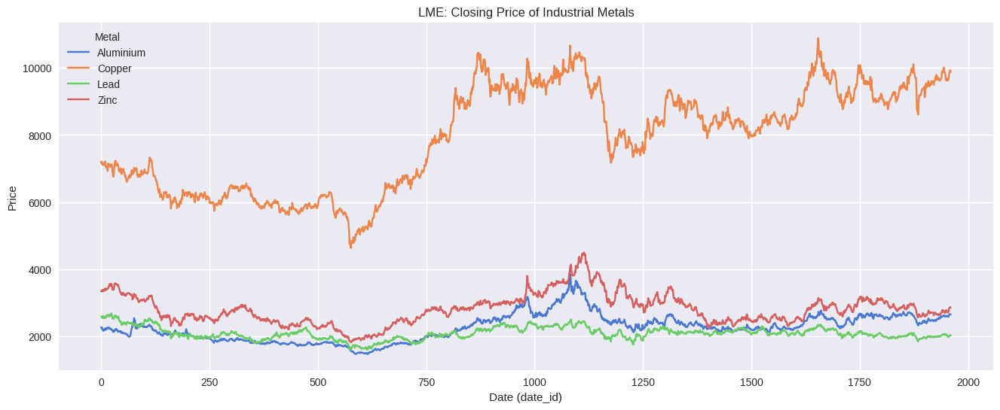

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Reshape the data (equivalent to pivot_longer)
lme_long = (
    train.iloc[:, :5]  # Select first 5 columns (0-based in Python)
    .rename(columns={
        train.columns[0]: "date_id",
        train.columns[1]: "Aluminium",
        train.columns[2]: "Copper",
        train.columns[3]: "Lead",
        train.columns[4]: "Zinc"
    })
    .melt(
        id_vars="date_id",
        var_name="Metal",
        value_name="Price"
    )
)

# Set figure size
plt.figure(figsize=(16, 6))

# Create the plot
sns.lineplot(
    data=lme_long,
    x="date_id",
    y="Price",
    hue="Metal",
    palette="muted"  # Similar to scale_color_theme("muted")
)

# Add titles and labels
plt.title("LME: Closing Price of Industrial Metals")
plt.xlabel("Date (date_id)")
plt.ylabel("Price")
plt.grid(True)

# Show the plot
plt.show()

## JPX Futures Closing Prices

Next, we'll examine the closing prices of the six commodity futures from JPX. To compare them on a similar scale, we use faceting to give each future its own panel.

In [7]:
# Filter for JPX Close prices
jpx_info = train_info[(train_info['Category'] == 'JPX') & 
                      (train_info['Type'] == 'Close')]
jpx_info

,Column_Id,Column,Category,Ticker,Type
23,24,JPX_Gold_Mini_Futures_Close,JPX,Gold_Mini_Futures,Close
24,25,JPX_Gold_Rolling-Spot_Futures_Close,JPX,Gold_Rolling-Spot_Futures,Close
25,26,JPX_Gold_Standard_Futures_Close,JPX,Gold_Standard_Futures,Close
26,27,JPX_Platinum_Mini_Futures_Close,JPX,Platinum_Mini_Futures,Close
27,28,JPX_Platinum_Standard_Futures_Close,JPX,Platinum_Standard_Futures,Close
28,29,JPX_RSS3_Rubber_Futures_Close,JPX,RSS3_Rubber_Futures,Close


The plots show diverse trends across different commodity futures, with Gold and Platinum contracts exhibiting distinct patterns.

<Figure size 1600x600 with 0 Axes>

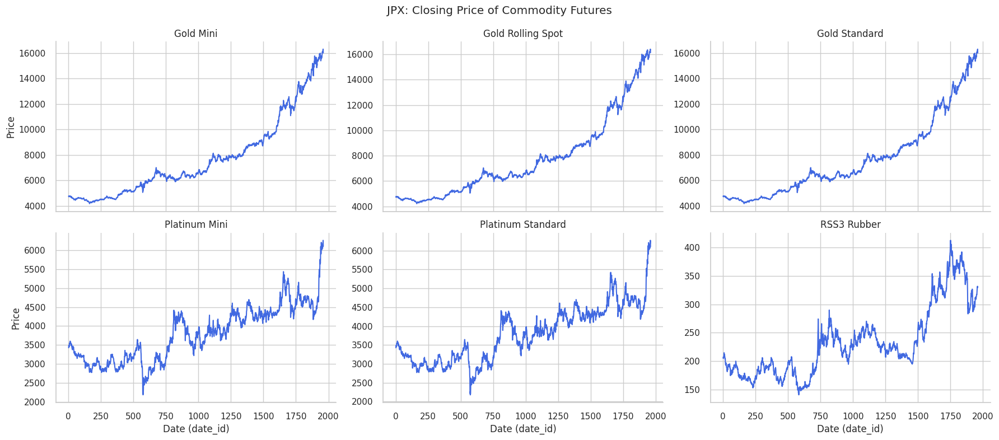

In [8]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Select columns and reshape data
jpx_long = (
    train.iloc[:, [0] + list(jpx_info['Column_Id'] - 1)]  # Convert to 0-based index
    .rename(columns={
        train.columns[0]: "date_id",
        train.columns[jpx_info['Column_Id'].iloc[0] - 1]: "Gold Mini",
        train.columns[jpx_info['Column_Id'].iloc[1] - 1]: "Gold Rolling Spot",
        train.columns[jpx_info['Column_Id'].iloc[2] - 1]: "Gold Standard",
        train.columns[jpx_info['Column_Id'].iloc[3] - 1]: "Platinum Mini",
        train.columns[jpx_info['Column_Id'].iloc[4] - 1]: "Platinum Standard",
        train.columns[jpx_info['Column_Id'].iloc[5] - 1]: "RSS3 Rubber"
    })
    .melt(
        id_vars="date_id",
        var_name="Futures",
        value_name="Price"
    )
)

# Set up the plot
plt.figure(figsize=(16, 6))
sns.set_theme(style="whitegrid", palette="bright")  # Vibrant colors

# Create faceted plot
g = sns.FacetGrid(
    jpx_long,
    col="Futures",
    col_wrap=3,
    height=4,
    aspect=1.5,
    sharey=False
)
g.map_dataframe(sns.lineplot, x="date_id", y="Price", color="royalblue")  # Single color
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Date (date_id)", "Price")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("JPX: Closing Price of Commodity Futures")

# Remove legend (not needed with facet titles)
plt.show()

## US Stock Adjusted Closing Prices

Now, let's look at the 95 US stocks and ETFs. We will again use faceting to observe individual price series.

In [9]:
# Filter for US Stock adjusted close prices
uss_info = train_info[(train_info['Category'] == 'US Stock') & 
                      (train_info['Type'] == 'adjusted close')]

# Extract tickers as a list
uss_tickers = uss_info['Ticker'].tolist()

# Display first few rows
uss_info.head()

,Column_Id,Column,Category,Ticker,Type
330,331,US_Stock_ACWI_adj_close,US Stock,ACWI,adjusted close
331,332,US_Stock_AEM_adj_close,US Stock,AEM,adjusted close
332,333,US_Stock_AG_adj_close,US Stock,AG,adjusted close
333,334,US_Stock_AGG_adj_close,US Stock,AGG,adjusted close
334,335,US_Stock_ALB_adj_close,US Stock,ALB,adjusted close


*Note: The y-axis is limited to a range of 0-150 to improve readability for the majority of tickers. This may hide the full range of higher-priced tickers.*

<Figure size 1600x2400 with 0 Axes>

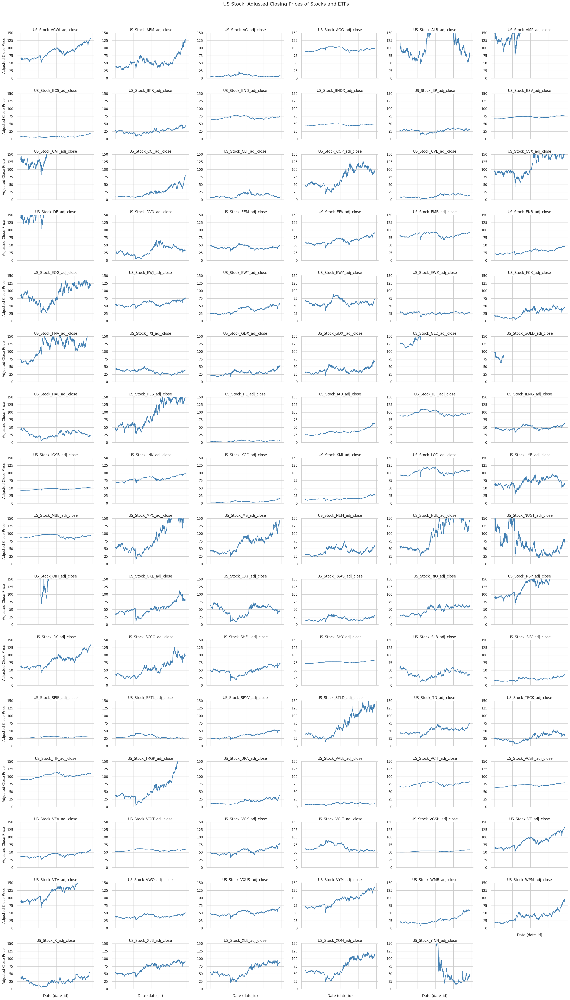

In [10]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Prepare column indices and names
column_indices = [0] + (uss_info['Column_Id'] - 1).tolist()
rename_dict = {train.columns[0]: "date_id"}
rename_dict.update(dict(zip(train.columns[1:], uss_tickers)))

# Extract relevant columns and reshape to long format
uss_long = (
    train.iloc[:, column_indices]
    .rename(columns=rename_dict)
    .melt(
        id_vars="date_id",
        var_name="Stock",
        value_name="Price"
    )
)

# Set up plot aesthetics
sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 24))  # Placeholder, actual size set by FacetGrid

# Create faceted line plots by Stock
g = sns.FacetGrid(
    uss_long,
    col="Stock",
    col_wrap=6,
    height=3,
    sharey=False,
    aspect=1.5
)
g.map_dataframe(
    sns.lineplot,
    x="date_id",
    y="Price",
    color="steelblue"
)

# Set consistent y-axis limit
for ax in g.axes.flat:
    ax.set_ylim(0, 150)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Format titles and layout
g.set_titles("{col_name}")
g.set_axis_labels("Date (date_id)", "Adjusted Close Price")
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("US Stock: Adjusted Closing Prices of Stocks and ETFs", fontsize=16)

# Remove legends to reduce clutter
for ax in g.axes.flat:
    legend = ax.get_legend()
    if legend:
        legend.remove()

plt.show()


## Foreign Currency Exchange Rates

Finally, we analyze the structure of the Forex data. The 38 currency pairs are derived from 10 unique currencies.

In [11]:
# Filter FX data and process currencies
forex_info = (
    train_info[train_info['Category'] == 'FX']
    .assign(
        Currency_1 = lambda x: x['Type'].str[:3],  # First 3 chars
        Currency_2 = lambda x: x['Type'].str[3:6]   # Next 3 chars
    )
    .drop(columns=['Type', 'Ticker'])
)

# Filter for JPY pairs
forex_info_jp = forex_info[forex_info['Currency_2'] == 'JPY']

# Create ticker strings
forex_tickers = forex_info_jp['Currency_1'] + '-' + forex_info_jp['Currency_2']
forex_tickers = forex_tickers.tolist()  # Convert to list if needed

# Display results
forex_info_jp

,Column_Id,Column,Category,Currency_1,Currency_2
520,521,FX_AUDJPY,FX,AUD,JPY
522,523,FX_CADJPY,FX,CAD,JPY
523,524,FX_CHFJPY,FX,CHF,JPY
526,527,FX_EURJPY,FX,EUR,JPY
529,530,FX_GBPJPY,FX,GBP,JPY
531,532,FX_NZDJPY,FX,NZD,JPY
534,535,FX_USDJPY,FX,USD,JPY
535,536,FX_ZARJPY,FX,ZAR,JPY
556,557,FX_NOKJPY,FX,NOK,JPY


The following graph shows which currency pairs are included in the dataset. For instance, JPY is connected to many other currencies, indicating that pairs like USD-JPY and EUR-JPY are present.

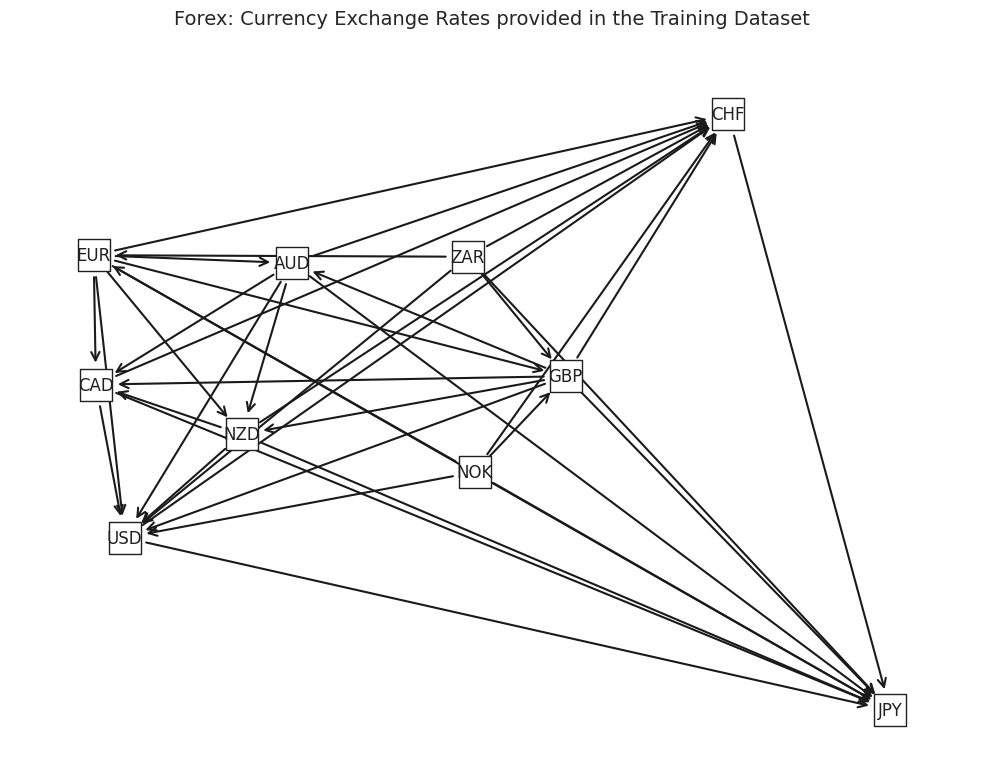

In [12]:


# Set up figure and random seed
plt.figure(figsize=(10, 8))
random.seed(42)  # For reproducible layout

# Create graph from edges
G = nx.from_pandas_edgelist(
    forex_info,
    source='Currency_1',
    target='Currency_2',
    create_using=nx.DiGraph()  # Directed graph
)

# Customize plot appearance
pos = nx.spring_layout(G, seed=42)  # Layout similar to layout_nicely()

nx.draw_networkx(
    G,
    pos=pos,
    with_labels=True,
    node_size=500,
    node_color='white',
    edgecolors='#202020',
    font_size=12,
    font_color='#202020',
    width=1.5,
    arrowsize=15,
    arrowstyle='->',
    node_shape='s'  # Square nodes
)

# Remove axes and add title
plt.axis('off')
plt.title("Forex: Currency Exchange Rates provided in the Training Dataset", 
          fontsize=14, pad=20)
plt.tight_layout()
plt.show()

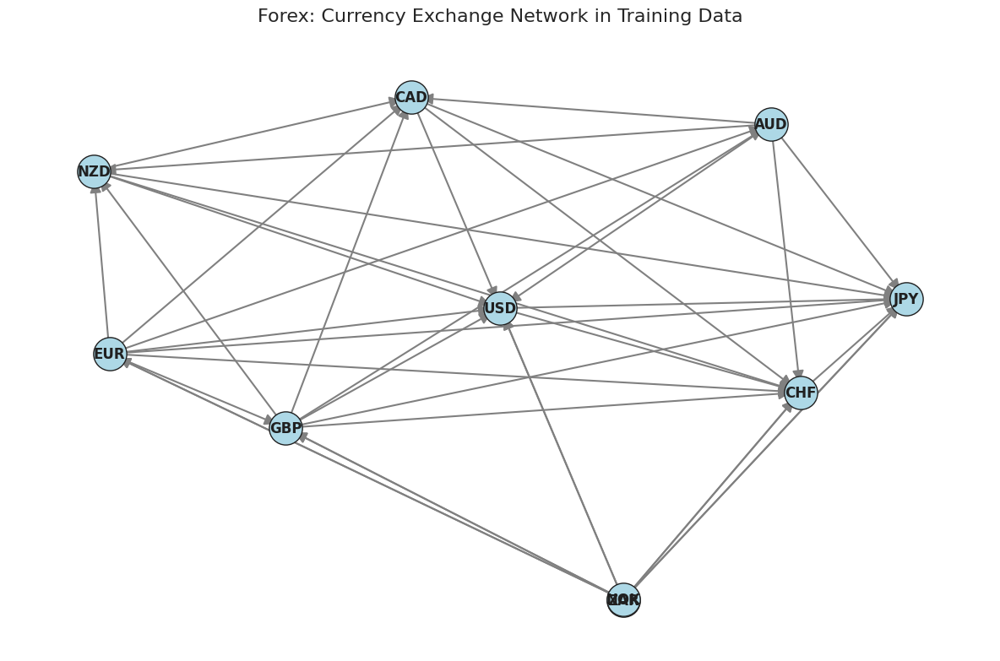

In [13]:
plt.figure(figsize=(12, 8))

# More sophisticated layout
pos = nx.kamada_kawai_layout(G)

# Draw with custom styling
nx.draw_networkx_nodes(
    G, pos,
    node_size=800,
    node_color='lightblue',
    edgecolors='#202020',
    linewidths=1
)

nx.draw_networkx_edges(
    G, pos,
    width=1.5,
    edge_color='gray',
    arrowsize=20,
    arrowstyle='-|>'
)

nx.draw_networkx_labels(
    G, pos,
    font_size=12,
    font_weight='bold',
    font_color='#202020'
)

plt.title("Forex: Currency Exchange Network in Training Data", 
          fontsize=16, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

In [14]:
#!pip install pyvis

In [15]:


net = Network(notebook=True, width="100%", height="800px")
net.from_nx(G)
net.show("forex_network.html")

forex_network.html


As a final step of our EDA about historical prices, let's plot the time series for all currency pairs against the Japanese Yen (JPY).

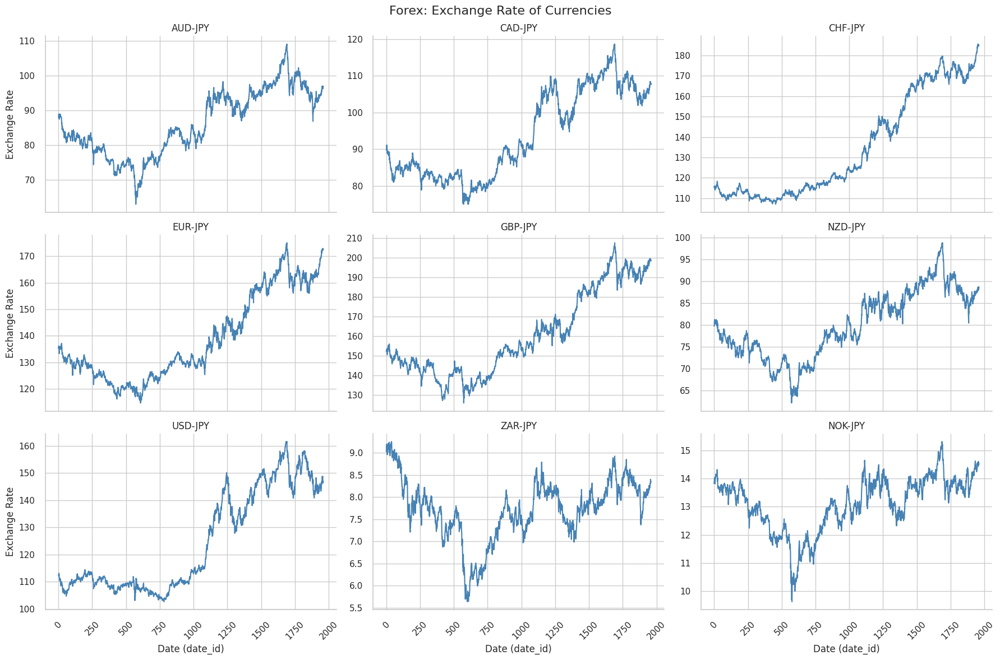

In [16]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Select and rename columns, reshape to long format
column_indices = [0] + (forex_info_jp['Column_Id'] - 1).tolist()
column_names = ['date_id'] + forex_tickers

forex_long = (
    train.iloc[:, column_indices]
    .copy()
    .set_axis(column_names, axis=1)
    .melt(
        id_vars='date_id',
        var_name='Currencies',
        value_name='Rate'
    )
)

# Set up plot theme
sns.set_theme(style='whitegrid')

# Create faceted line plots
g = sns.FacetGrid(
    forex_long,
    col='Currencies',
    col_wrap=3,
    height=4,
    aspect=1.5,
    sharey=False
)
g.map_dataframe(
    sns.lineplot,
    x='date_id',
    y='Rate',
    color='steelblue'
)

# Format each subplot
g.set_titles('{col_name}')
g.set_axis_labels('Date (date_id)', 'Exchange Rate')
g.fig.subplots_adjust(top=0.92)
g.fig.suptitle('Forex: Exchange Rate of Currencies', fontsize=16)

# Rotate x-axis labels and remove legends
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    legend = ax.get_legend()
    if legend:
        legend.remove()

plt.tight_layout()
plt.show()


The exchange rates show varying levels of volatility and correlation over the observed period.


# Logarithmic Returns

The `train_labels.csv` contains the target variables for this competition. It has 425 columns: one for `date_id`, and 424 `target_*` columns. The calculation method for each target is explained in the corresponding row of `target_pairs.csv`.

Each target is either the **logarithmic return** of a single historical price feature or the **difference of logarithmic returns** of two features (a spread; see below).

**Definition of Loarithmic Return**

The logarithmic return (or log return) of an asset over $k$ time periods is calculated using its price at two points in time. Let $P_t$ be the closing price at time $t$ and $P_{t-k}$ be the price $k$ periods earlier. The log return, $r_t$, is defined as:

$$
r_t = \ln{\left( \frac{P_t}{P_{t-k}} \right)} = \ln(P_t) - \ln(P_{t-k})
$$

The diffrence between the log returns of two assets, $A$ and $B$, is often called a **spread**. This concept is central to a strategy known as [**Pairs Trading**](https://en.wikipedia.org/wiki/Pairs_trade). 

$$
Spread_t = r^A_t - r^B_t = \left(\ln(P^A_t) - \ln(P^A_{t-k})\right) - \left(\ln(P^B_t) - \ln(P^B_{t-k})\right)
$$

First, we define a helper function to calculate log returns and then parse the `target_pairs.csv` to understand how each target is constructed.

In [17]:


# Log return function
def log_return(data, lag=1, padding=True):
    n = len(data)
    logret = np.log(data[lag:] / data[:-lag])
    return np.concatenate([np.full(lag, np.nan), logret]) if padding else logret

# Process target definitions
target_definitions = pairs['pair'].str.split(' - ', expand=True)

# Create target info dataframe
target_info = (
    pairs.assign(
        is_pair=target_definitions[1] != "",
        price_1=target_definitions[0],
        price_2=target_definitions[1]
    )
    .drop(columns=['pair'])
)
target_info
# Example usage on a sample dataframe:
# df['log_ret'] = log_return(df['price'], lag=5)

,target,lag,is_pair,price_1,price_2
0,target_0,1,True,US_Stock_VT_adj_close,None
1,target_1,1,True,LME_PB_Close,US_Stock_VT_adj_close
2,target_2,1,True,LME_CA_Close,LME_ZS_Close
3,target_3,1,True,LME_AH_Close,LME_ZS_Close
4,target_4,1,True,LME_AH_Close,JPX_Gold_Standard_Futures_Close
...,...,...,...,...,...
419,target_419,4,True,FX_NOKUSD,LME_AH_Close
420,target_420,4,True,JPX_Gold_Standard_Futures_Close,US_Stock_RY_adj_close
421,target_421,4,True,US_Stock_EWT_adj_close,LME_AH_Close
422,target_422,4,True,JPX_Platinum_Standard_Futures_Close,FX_NOKCHF


In [18]:
def log_return(data, lag=1, padding=True, fill_method=None):
    """
    Enhanced log return calculation with options for:
    - padding (NA values at start)
    - fill method for NA values (None, 'ffill', 'bfill', etc.)
    """
    n = len(data)
    if n <= lag:
        return np.full(n, np.nan)
    
    logret = np.log(data[lag:].values / data[:-lag].values)
    
    if padding:
        result = np.concatenate([np.full(lag, np.nan), logret])
    else:
        result = logret
    
    if fill_method:
        return pd.Series(result).fillna(method=fill_method).values
    return result

# Process target info with more robust handling
target_info = (
    pairs.assign(
        is_pair=lambda x: target_definitions[1].ne(""),
        price_1=lambda x: target_definitions[0],
        price_2=lambda x: target_definitions[1].where(target_definitions[1].ne(""), None)
    )
    .drop(columns=['pair'])
    .reset_index(drop=True)
)
target_info

,target,lag,is_pair,price_1,price_2
0,target_0,1,True,US_Stock_VT_adj_close,None
1,target_1,1,True,LME_PB_Close,US_Stock_VT_adj_close
2,target_2,1,True,LME_CA_Close,LME_ZS_Close
3,target_3,1,True,LME_AH_Close,LME_ZS_Close
4,target_4,1,True,LME_AH_Close,JPX_Gold_Standard_Futures_Close
...,...,...,...,...,...
419,target_419,4,True,FX_NOKUSD,LME_AH_Close
420,target_420,4,True,JPX_Gold_Standard_Futures_Close,US_Stock_RY_adj_close
421,target_421,4,True,US_Stock_EWT_adj_close,LME_AH_Close
422,target_422,4,True,JPX_Platinum_Standard_Futures_Close,FX_NOKCHF


## Logarithmic Return of Single Asset

Most targets are spreads between two price features. However, four targets are based on the log return of a single asset. Let's investigate these first.

In [19]:
# Filter where is_pair is False
non_pairs = target_info[target_info['is_pair'] == False]
non_pairs

,target,lag,is_pair,price_1,price_2


These four single-asset targets are noteworthy. At first glance, the choice of these specific assets and the varying lags (1, 2, 3, and 4) is intriguing and not immediately obvious.

**Verifying the Target Calculation (target_0)**

Let's verify the calculation for `target_0`. We'll compare the official target values from `train_labels.csv` with our own calculation using the `log_return()` function.

In [20]:
labels

,date_id,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,target_10,target_11,target_12,target_13,target_14,target_15,target_16,target_17,target_18,target_19,target_20,target_21,target_22,target_23,target_24,target_25,target_26,target_27,target_28,target_29,target_30,target_31,target_32,target_33,target_34,target_35,target_36,target_37,target_38,target_39,target_40,target_41,target_42,target_43,target_44,target_45,target_46,target_47,target_48,target_49,target_50,target_51,target_52,target_53,target_54,target_55,target_56,target_57,target_58,target_59,target_60,target_61,target_62,target_63,target_64,target_65,target_66,target_67,target_68,target_69,target_70,target_71,target_72,target_73,target_74,target_75,target_76,target_77,target_78,target_79,target_80,target_81,target_82,target_83,target_84,target_85,target_86,target_87,target_88,target_89,target_90,target_91,target_92,target_93,target_94,target_95,target_96,target_97,target_98,target_99,target_100,target_101,target_102,target_103,target_104,target_105,target_106,target_107,target_108,target_109,target_110,target_111,target_112,target_113,target_114,target_115,target_116,target_117,target_118,target_119,target_120,target_121,target_122,target_123,target_124,target_125,target_126,target_127,target_128,target_129,target_130,target_131,target_132,target_133,target_134,target_135,target_136,target_137,target_138,target_139,target_140,target_141,target_142,target_143,target_144,target_145,target_146,target_147,target_148,target_149,target_150,target_151,target_152,target_153,target_154,target_155,target_156,target_157,target_158,target_159,target_160,target_161,target_162,target_163,target_164,target_165,target_166,target_167,target_168,target_169,target_170,target_171,target_172,target_173,target_174,target_175,target_176,target_177,target_178,target_179,target_180,target_181,target_182,target_183,target_184,target_185,target_186,target_187,target_188,target_189,target_190,target_191,target_192,target_193,target_194,target_195,target_196,target_197,target_198,target_199,target_200,target_201,target_202,target_203,target_204,target_205,target_206,target_207,target_208,target_209,target_210,target_211,target_212,target_213,target_214,target_215,target_216,target_217,target_218,target_219,target_220,target_221,target_222,target_223,target_224,target_225,target_226,target_227,target_228,target_229,target_230,target_231,target_232,target_233,target_234,target_235,target_236,target_237,target_238,target_239,target_240,target_241,target_242,target_243,target_244,target_245,target_246,target_247,target_248,target_249,target_250,target_251,target_252,target_253,target_254,target_255,target_256,target_257,target_258,target_259,target_260,target_261,target_262,target_263,target_264,target_265,target_266,target_267,target_268,target_269,target_270,target_271,target_272,target_273,target_274,target_275,target_276,target_277,target_278,target_279,target_280,target_281,target_282,target_283,target_284,target_285,target_286,target_287,target_288,target_289,target_290,target_291,target_292,target_293,target_294,target_295,target_296,target_297,target_298,target_299,target_300,target_301,target_302,target_303,target_304,target_305,target_306,target_307,target_308,target_309,target_310,target_311,target_312,target_313,target_314,target_315,target_316,target_317,target_318,target_319,target_320,target_321,target_322,target_323,target_324,target_325,target_326,target_327,target_328,target_329,target_330,target_331,target_332,target_333,target_334,target_335,target_336,target_337,target_338,target_339,target_340,target_341,target_342,target_343,target_344,target_345,target_346,target_347,target_348,target_349,target_350,target_351,target_352,target_353,target_354,target_355,target_356,target_357,target_358,target_359,target_360,target_361,target_362,target_363,target_364,target_365,target_366,target_367,target_368,target_369,target_370,target_371,target_37

In [21]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Enhanced version with error handling
def log_return(data, lag=1, padding=True):
    """Calculate log returns with proper handling of edge cases"""
    if len(data) <= lag:
        return np.full(len(data), np.nan)
    try:
        logret = np.log(data[lag:].values / data[:-lag].values)
        return np.concatenate([np.full(lag, np.nan), logret]) if padding else logret
    except Exception as e:
        print(f"Error calculating log returns: {e}")
        return np.full(len(data), np.nan)

# Create target dataframe
target = pd.DataFrame({
    'date_id': labels['date_id'],
    'target': labels['target_0'],
    'calculated': log_return(train['US_Stock_VT_adj_close'], lag=1)
})

# Display first few rows
target.head()

,date_id,target,calculated
0,0,0.005948,NaN
1,1,0.005783,0.006785
2,2,0.001048,0.005948
3,3,0.001700,0.005783
4,4,-0.003272,0.001048


In [22]:
target

,date_id,target,calculated
0,0,0.005948,NaN
1,1,0.005783,0.006785
2,2,0.001048,0.005948
3,3,0.001700,0.005783
4,4,-0.003272,0.001048
...,...,...,...
1956,1956,0.002761,-0.000847
1957,1957,0.011424,0.002461
1958,1958,-0.002654,0.002761
1959,1959,0.002124,0.011424


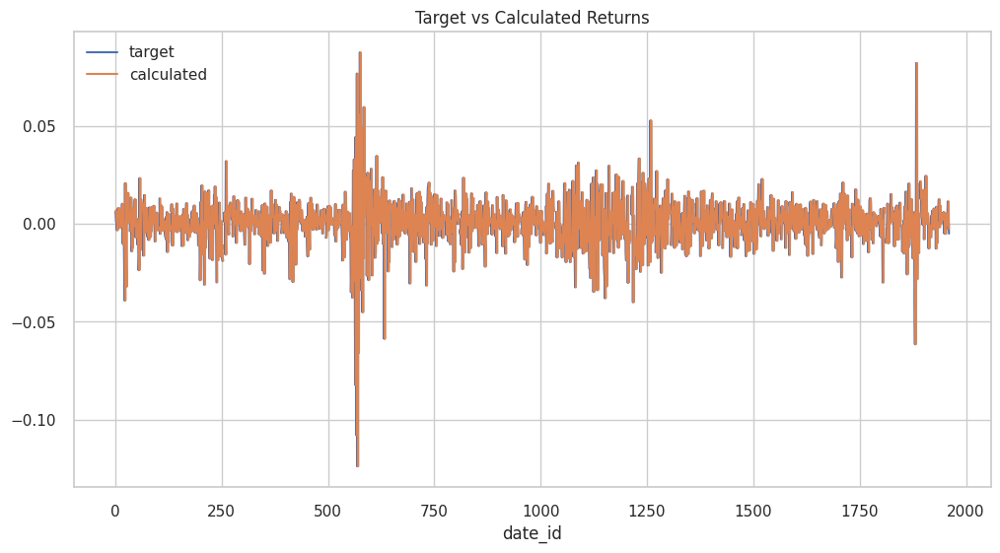

In [23]:
#target = target.set_index('date_id')
import matplotlib.pyplot as plt

target.plot(x='date_id', y=['target', 'calculated'], 
            figsize=(12, 6), title='Target vs Calculated Returns')
plt.show()

In [24]:
correlation = target[['target', 'calculated']].corr().iloc[0,1]
print(f"Correlation between target and calculated: {correlation:.4f}")

Correlation between target and calculated: 0.1231


In [25]:
target_clean = target.dropna(subset=['target', 'calculated'])
correlation = target_clean[['target', 'calculated']].corr().iloc[0,1]
print(f"Correlation between target and calculated: {correlation:.4f}")

Correlation between target and calculated: 0.1231


The table above reveals a critical detail about the target definition. The value of `target_0` at `date_id = 0` (which is 0.005948...) does not match our calculated value at `date_id = 0` (which is NA). Instead, it matches the calculated value at `date_id = 2`.

This confirms that the target for `date_id = t` is the log return calculated from `t + 1` to `t + lag + 1`. This can actually be obtained by the `generate_log_returns()` function defined in [the competition notebook](https://www.kaggle.com/code/sohier/mitsui-target-calculation-example).

The rationale for this forward-looking target can be interpreted as a hypothetical trading scenario: At the end of day `t`, we use the information available up to that point to decide on a trade. We then execute that trade at the "closing" price of day `t + 1`, and the target represents the realized log return of that position calculated over the subsequent lag period (i.e., using the price at `t + 1 + lag`).

This forward-looking nature is a crucial feature of the competition datasets. The following plots show that our calculated series is simply a lagged version of the official target series.

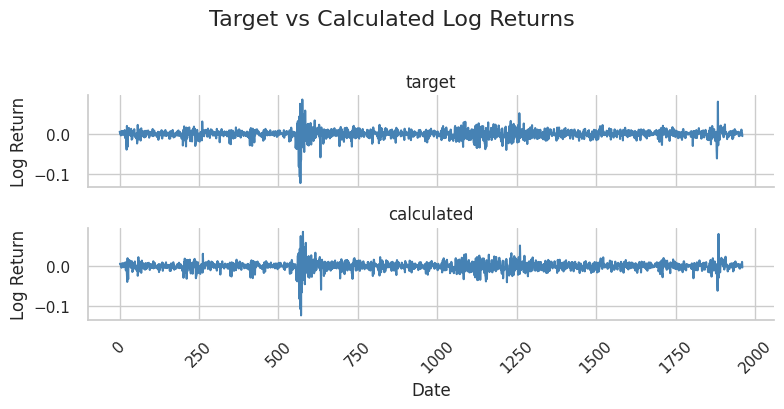

In [26]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Reshape the data to long format (similar to pivot_longer in R)
target_long = target.melt(
    id_vars='date_id',
    var_name='Class',
    value_name='LogReturn'
)

# Set up seaborn theme
sns.set_style('whitegrid')

# Create faceted line plot
g = sns.FacetGrid(
    data=target_long,
    row='Class',
    aspect=4,
    height=2,         # Row height
    sharey=False
)

g.map_dataframe(
    sns.lineplot,
    x='date_id',
    y='LogReturn',
    color='steelblue'
)

# Titles and labels
g.set_titles(row_template="{row_name}")
g.set_axis_labels("Date", "Log Return")
g.fig.subplots_adjust(hspace=0.4)  # Space between facets

# Rotate x-axis labels and remove legends
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    legend = ax.get_legend()
    if legend:
        legend.remove()

# Add main title
g.fig.suptitle('Target vs Calculated Log Returns', fontsize=16, y=1.02)

plt.tight_layout()
plt.show()


It's a well-known phenomenon that financial log returns tend to exhibit "fat tails" when compared to a theoretical normal distribution. To see if our data follows this pattern, the following plot compares the kernel density estimate (KDE) of the `target` log returns against a normal distribution with the same mean and standard deviation.

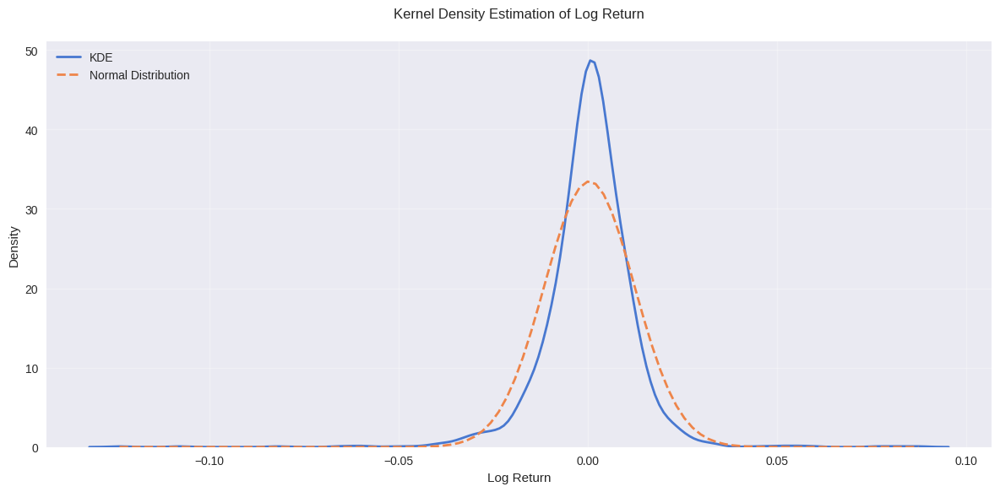

In [27]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Filter out NA values and get returns
returns = target['target'].dropna()

# Set up plot
plt.figure(figsize=(12, 6))
sns.set_style('white')
plt.style.use('seaborn')  # Similar to theme_midr()

# Create color palette (muted colors)
colors = sns.color_palette('muted', 2)

# Plot kernel density estimation
sns.kdeplot(returns, color=colors[0], linewidth=2, label='KDE')

# Plot normal distribution with same mean/std
x = np.linspace(returns.min(), returns.max(), 100)
plt.plot(x, norm.pdf(x, returns.mean(), returns.std()), 
         color=colors[1], linestyle='--', linewidth=2, 
         label='Normal Distribution')

# Add titles and legend
plt.title('Kernel Density Estimation of Log Return', pad=20)
plt.xlabel('Log Return')
plt.ylabel('Density')
plt.legend(loc='upper left', frameon=False)
plt.grid(True, alpha=0.3)

# Remove top and right spines
sns.despine()

plt.tight_layout()
plt.show()

The Q-Q (Quantile-Quantile) plot below provides further evidence for this "fat-tailed" behavior.

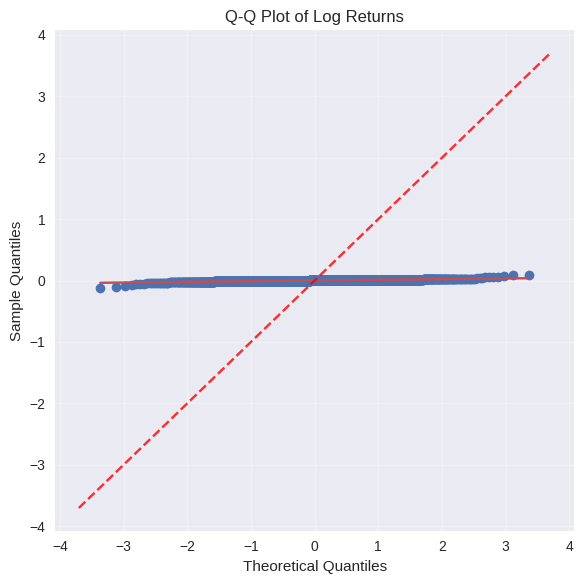

In [28]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Set up plot
plt.figure(figsize=(6, 6))
plt.style.use('seaborn')  # Similar to theme_midr()

# Create Q-Q plot
stats.probplot(returns, dist="norm", plot=plt)

# Add reference line
x = np.linspace(*plt.xlim())
plt.plot(x, x, color='red', linestyle='--', alpha=0.8)  # 45-degree reference line

# Formatting
plt.title('Q-Q Plot of Log Returns')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

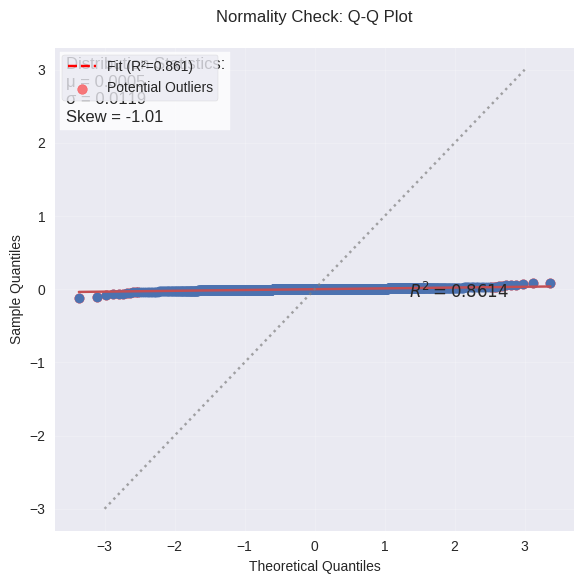

In [29]:
plt.figure(figsize=(6, 6))

# Create Q-Q plot with regression line
(res, fit) = stats.probplot(returns, dist="norm", plot=plt, rvalue=True)

# Format reference line
plt.plot(fit[0], fit[1], color='red', linestyle='--', 
         label=f'Fit (R²={fit[2]**2:.3f})')

# Add perfect normal line
plt.plot([-3, 3], [-3, 3], color='gray', linestyle=':', alpha=0.7)

# Highlight potential outliers
threshold = 2.5  # Standard deviations
outliers = res[0][np.abs(res[0]) > threshold]
plt.scatter(outliers, res[1][np.abs(res[0]) > threshold], 
            color='red', alpha=0.5, label='Potential Outliers')

# Formatting
plt.title('Normality Check: Q-Q Plot\n', fontsize=12)
plt.xlabel('Theoretical Quantiles', fontsize=10)
plt.ylabel('Sample Quantiles', fontsize=10)
plt.legend(loc='upper left', frameon=True)
plt.grid(True, alpha=0.2)
sns.despine()

# Add text box with statistics
stats_text = f"""Distribution Statistics:
μ = {returns.mean():.4f}
σ = {returns.std():.4f}
Skew = {returns.skew():.2f}"""
plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

In [30]:
from scipy.stats import shapiro
stat, p = shapiro(returns)
print(f'Shapiro-Wilk p-value: {p:.4f}')

Shapiro-Wilk p-value: 0.0000


**Verifying the Target Calculation - target_318**

Let's perform the same verification for `target_318`, which has a lag of 4.

In [31]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Enhanced version with error handling
def log_return(data, lag=1, padding=True):
    """Calculate log returns with proper handling of edge cases"""
    if len(data) <= lag:
        return np.full(len(data), np.nan)
    try:
        logret = np.log(data[lag:].values / data[:-lag].values)
        return np.concatenate([np.full(lag, np.nan), logret]) if padding else logret
    except Exception as e:
        print(f"Error calculating log returns: {e}")
        return np.full(len(data), np.nan)

# Create target dataframe with 4-period returns
target_318 = pd.DataFrame({
    'date_id': labels['date_id'],
    'target': labels['target_318'],
    'calculated': log_return(train['FX_NOKEUR'], lag=4)
})

# Display first 5 rows
target_318.head()

,date_id,target,calculated
0,0,0.006156,NaN
1,1,0.009334,NaN
2,2,0.004108,NaN
3,3,-0.000358,NaN
4,4,0.001180,0.013567


In [32]:
target_318

,date_id,target,calculated
0,0,0.006156,NaN
1,1,0.009334,NaN
2,2,0.004108,NaN
3,3,-0.000358,NaN
4,4,0.001180,0.013567
...,...,...,...
1956,1956,-0.004312,-0.000959
1957,1957,0.000969,0.000690
1958,1958,0.008974,0.008944
1959,1959,0.010769,0.004446


As with the previous example, the target values are forward-looking. The value of `target_318` at `date_id = 0` (0.006156...) matches our calculated value at `date_id = 5`.

This confirms the general rule: the target for `date_id = t` is the log return calculated from prices at `t + 1` and `t + 1 + lag`.

Again, the plot illustrates that our calculated log return series perfectly matches the official target series, just with a time shift.

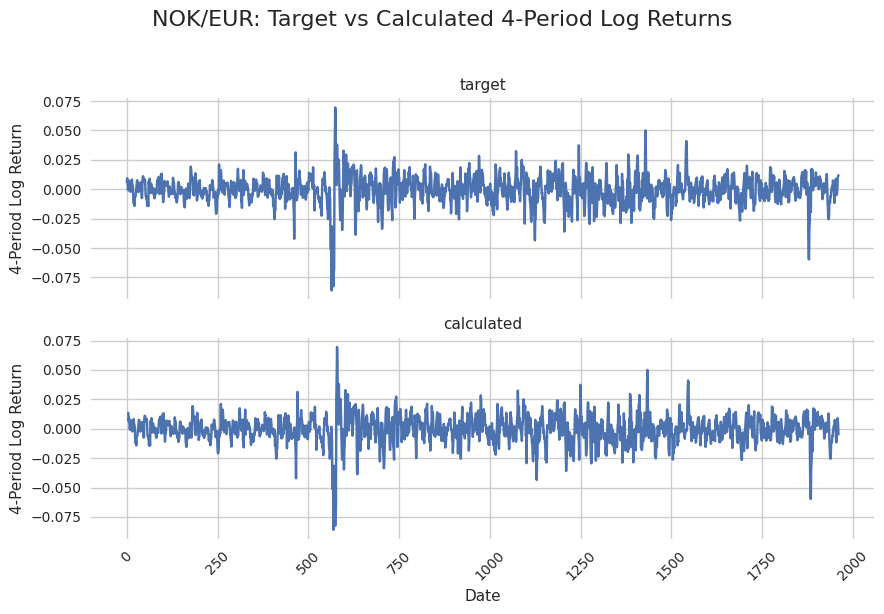

In [33]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Reshape the data from wide to long format
target_long = target_318.melt(
    id_vars='date_id',
    var_name='Class',
    value_name='LogReturn'
)

# Set up seaborn style
sns.set_style("whitegrid")

# Create faceted line plots
g = sns.FacetGrid(
    data=target_long,
    row='Class',        # Create a vertical facet for each class
    aspect=3,           # Width-to-height ratio
    height=3,           # Height of each subplot
    sharey=False        # Allow independent y-axes
)

g.map_dataframe(
    sns.lineplot,
    x='date_id',
    y='LogReturn',
    color='#1f77b4' if len(target_long['Class'].unique()) == 1 else None,
    palette=['#1f77b4', '#ff7f0e'] if len(target_long['Class'].unique()) > 1 else None
)

# Set titles and labels
g.set_titles("{row_name}")
g.set_axis_labels("Date", "4-Period Log Return")
g.fig.subplots_adjust(hspace=0.4)  # Space between facets

# Clean up legend and format x-axis
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    legend = ax.get_legend()
    if legend:
        legend.remove()

# Add main title
g.fig.suptitle("NOK/EUR: Target vs Calculated 4-Period Log Returns", fontsize=16, y=1.02)

plt.tight_layout()
plt.show()


In [34]:
target_clean = target_318.dropna(subset=['target', 'calculated'])
correlation = target_clean[['target', 'calculated']].corr().iloc[0,1]
print(f"Correlation between target and calculated: {correlation:.4f}")

Correlation between target and calculated: 0.0522


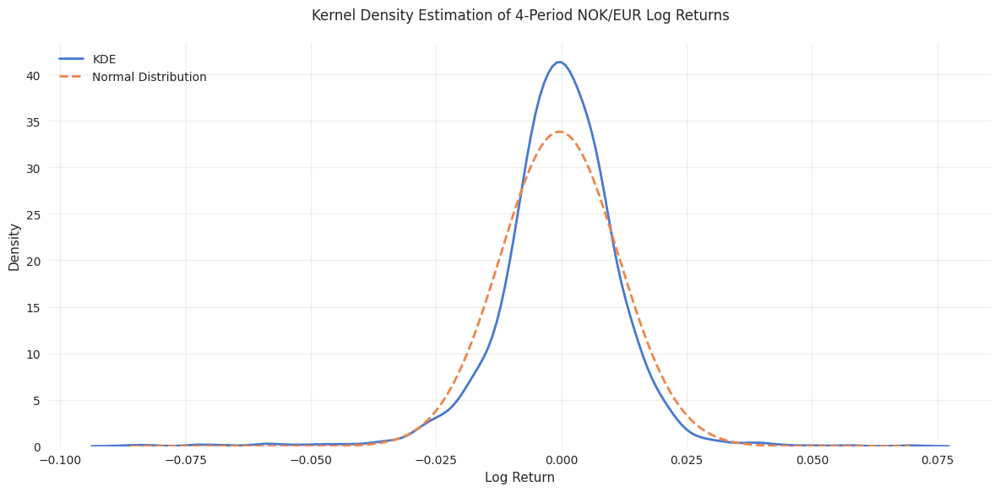

In [35]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Filter out NA values and get returns
returns = target_318['target'].dropna()

# Set up plot with muted color palette
plt.figure(figsize=(12, 6))
sns.set_style("white")
colors = sns.color_palette("muted", 2)  # Get two muted colors

# Plot kernel density estimation
sns.kdeplot(returns, color=colors[0], linewidth=2, label='KDE')

# Plot normal distribution with same mean/std
x = np.linspace(returns.min(), returns.max(), 500)
plt.plot(x, norm.pdf(x, returns.mean(), returns.std()), 
         color=colors[1], linestyle='--', linewidth=2, 
         label='Normal Distribution')

# Add legend and titles
plt.title('Kernel Density Estimation of 4-Period NOK/EUR Log Returns', pad=20)
plt.xlabel('Log Return')
plt.ylabel('Density')
plt.legend(loc='upper left', frameon=False)

# Add grid and clean up borders
plt.grid(True, alpha=0.3)
sns.despine()

plt.tight_layout()
plt.show()

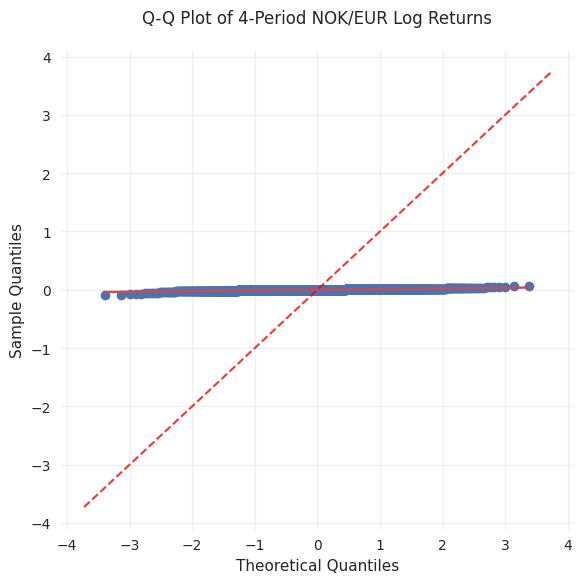

In [36]:


# Set up plot with square aspect ratio
plt.figure(figsize=(6, 6))
sns.set_style("whitegrid")  # Clean background with grid

# Create Q-Q plot
stats.probplot(returns, dist="norm", plot=plt)

# Add perfect normal line (equivalent to qqline)
x = np.linspace(*plt.xlim())  # Get current axis limits
plt.plot(x, x, color='red', linestyle='--', linewidth=1.5, alpha=0.8)

# Add title and labels
plt.title('Q-Q Plot of 4-Period NOK/EUR Log Returns', pad=20)
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')

# Add grid and remove top/right spines
plt.grid(True, alpha=0.3)
sns.despine()

plt.tight_layout()
plt.show()

## Spread between Pair of Assets

Most of the target variables in this competition are spreads, defined as the difference between the logarithmic returns of two different assets. This approach is central to statistical arbitrage strategies like Pairs Trading. Let's investigate one of these pairs to verify its calculation.

In [37]:
# Filter for paired targets and show first few rows
paired_targets = target_info[target_info['is_pair'] == True].head()
paired_targets

,target,lag,is_pair,price_1,price_2
0,target_0,1,True,US_Stock_VT_adj_close,None
1,target_1,1,True,LME_PB_Close,US_Stock_VT_adj_close
2,target_2,1,True,LME_CA_Close,LME_ZS_Close
3,target_3,1,True,LME_AH_Close,LME_ZS_Close
4,target_4,1,True,LME_AH_Close,JPX_Gold_Standard_Futures_Close


As show in the above table, the targets are constructed from a diverse mix of assets across different categories (LME, JPX, US Stocks, Forex).

**Verifying the Spread Calculation (target_2)**

As an example, we will investigate `target_2`, which is the spread between the log returns of **LME Copper** (`LME_CA_Close`) and **LME Zinc** (`LME_ZS_Close`).
We'll calculate the individual log returns for each asset, compute their difference (Column `calculated`), and compare it to the official `target_2` value from `train_labels.csv`.

In [38]:
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Create target DataFrame
target = pd.DataFrame({
    'date_id': labels['date_id'],
    'target': labels['target_2'],
    'returns_1': log_return(train[target_info.iloc[2, 3]], lag=1),  # Row 3, Column 4 (0-based)
    'returns_2': log_return(train[target_info.iloc[2, 4]], lag=1)   # Row 3, Column 5 (0-based)
})

# Calculate the difference
target['calculated'] = target['returns_1'] - target['returns_2']

# Display first few rows
target.head()

,date_id,target,returns_1,returns_2,calculated
0,0,-0.004675,NaN,NaN,NaN
1,1,-0.007052,-0.008083,-0.006591,-0.001492
2,2,-0.008934,0.005790,0.010465,-0.004675
3,3,0.011943,-0.009434,-0.002382,-0.007052
4,4,0.006856,0.000562,0.009496,-0.008934


As with the single-asset targets, we observe that our calculated spread series is a lagged version of the official target series. This confirms that the forward-looking calculation applies to spreads as well: the spread for `date_id = t` is based on the returns calculated from `t + 1` onwards.

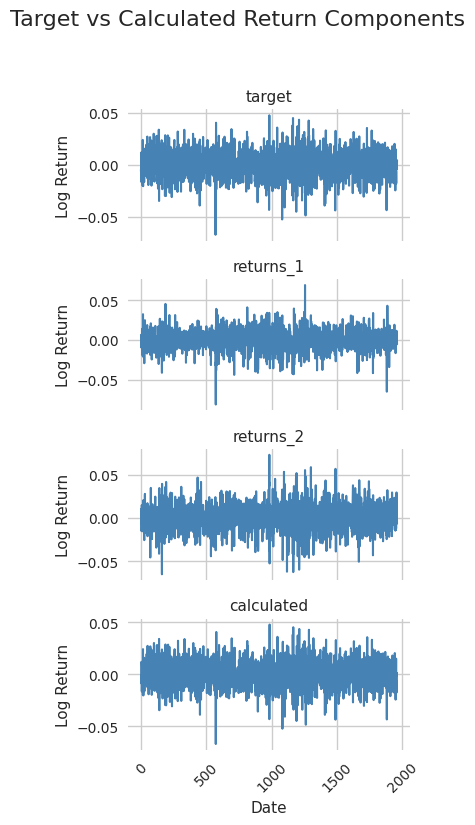

In [39]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Reshape from wide to long format
target_long = target.melt(
    id_vars='date_id',
    var_name='Class',
    value_name='LogReturn'
)

# Set up Seaborn style
sns.set_style("whitegrid")

# Create vertically stacked line plots (one per class)
g = sns.FacetGrid(
    data=target_long,
    row='Class',       # One facet per class (stacked vertically)
    aspect=2,          # Width/height ratio
    height=2,          # Height per facet
    sharey=False       # Independent y-axes
)

# Plot lineplot for each facet
g.map_dataframe(
    sns.lineplot,
    x='date_id',
    y='LogReturn',
    color='steelblue',  # Same color in all subplots for visual consistency
    linewidth=1.5
)

# Customize appearance
g.set_titles("{row_name}")
g.set_axis_labels("Date", "Log Return")
g.fig.subplots_adjust(hspace=0.3)  # Space between subplots

# Clean up axis labels and ticks
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    legend = ax.get_legend()
    if legend:
        legend.remove()

# Add a main title
g.fig.suptitle("Target vs Calculated Return Components", fontsize=16, y=1.03)

plt.tight_layout()
plt.show()


In [40]:


fig = px.line(
    target_long,
    x='date_id',
    y='LogReturn',
    color='Class',
    facet_row='Class',
    height=1200,
    title='Target vs Calculated Return Components'
)
fig.update_layout(showlegend=False)
fig.update_yaxes(matches=None)  # Independent y-axes
fig.show()

Finally, let's create a scatter plot to visualize the relationship between the daily log returns of the two assets in our pair (Copper and Zinc). The dashed line represents `y = x`. Points close to this line indicate days where both assets had similar returns.

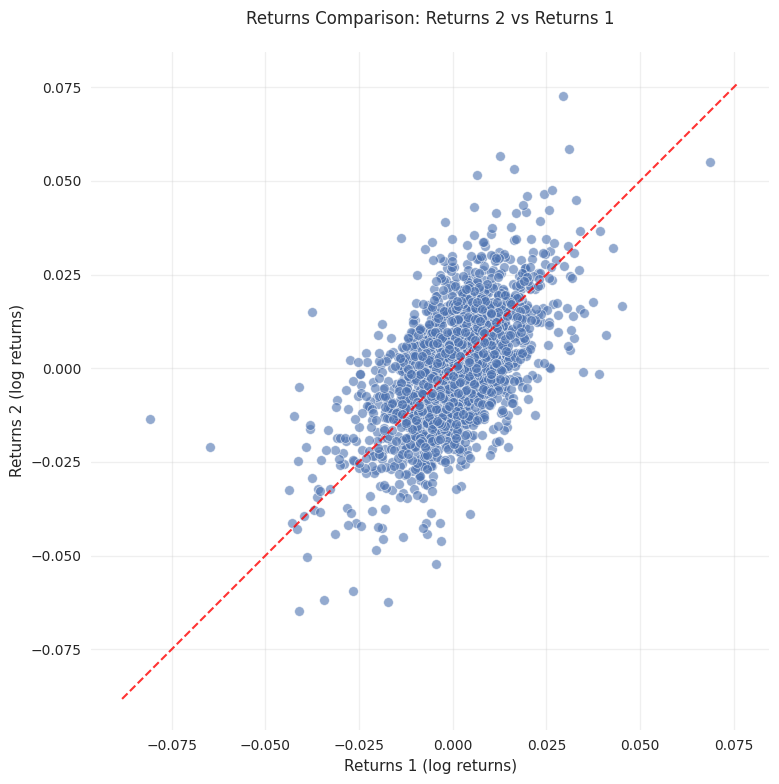

In [41]:


# Set up the plot
plt.figure(figsize=(8, 8))
sns.set_style("whitegrid")  # Clean background with grid

# Create scatter plot
sns.scatterplot(
    data=target,
    x='returns_1',
    y='returns_2',
    alpha=0.6  # Slightly transparent points
)

# Add 45-degree reference line
xlim = plt.xlim()
plt.plot(xlim, xlim, '--', color='red', linewidth=1.5, alpha=0.8)  # Dashed line

# Add labels and title
plt.xlabel('Returns 1 (log returns)')
plt.ylabel('Returns 2 (log returns)')
plt.title('Returns Comparison: Returns 2 vs Returns 1', pad=20)

# Equal aspect ratio to make the 45-degree line accurate
plt.gca().set_aspect('equal')

# Add grid and remove top/right spines
plt.grid(True, alpha=0.3)
sns.despine()

plt.tight_layout()
plt.show()

The scatter plot shows a positive correlation between the returns of Copper and Zinc, which is expected for industrial metals.

## Six Hub Assets and Correlation Structure

To conclude our initial EDA, let's visualize the entire target landscape as a network graph. In this graph, each asset (Ticker) is a node, and each target pair defined in `target_pairs.csv` creates a link between two nodes. This helps us understand the overall structure and connectivity of the assets in the competition.

The following six assets seem to be more important than other assets:
- Gold_Standard_Futures
- Platinum_Standard_Futures
- AH
- CA
- PB
- ZS

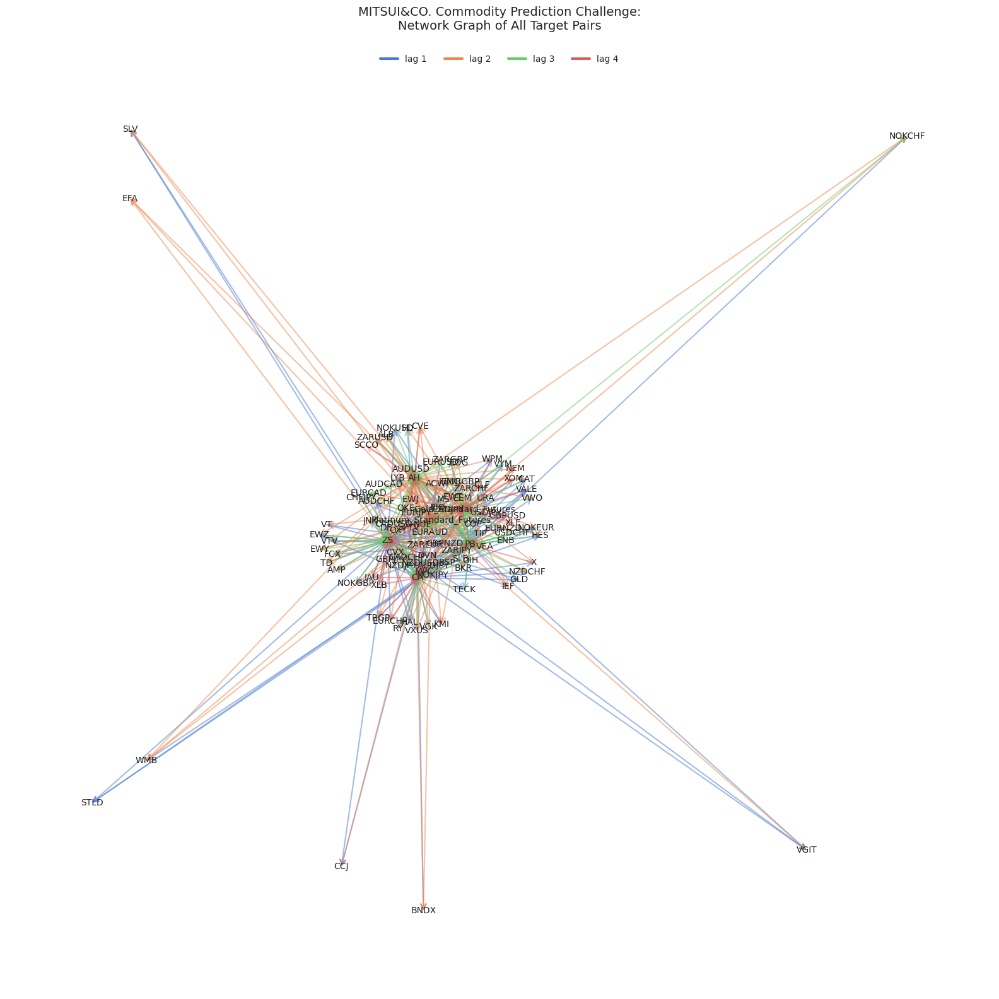

In [42]:


# Prepare the data
temp = (
    target_info.assign(
        price_2=lambda x: x['price_2'].where(x['price_2'] != "", x['price_1'])
    )
    .merge(
        train_info[['Ticker', 'Column']].rename(columns={'Ticker': 'P1', 'Column': 'price_1'}),
        on='price_1'
    )
    .merge(
        train_info[['Ticker', 'Column']].rename(columns={'Ticker': 'P2', 'Column': 'price_2'}),
        on='price_2'
    )
)

# Set random seed and create graph
random.seed(42)
plt.figure(figsize=(16, 16))
sns.set_style("white")

# Create directed graph
G = nx.from_pandas_edgelist(
    temp, 
    source='P1', 
    target='P2',
    create_using=nx.DiGraph()
)

# Set edge colors based on lag
muted_palette = sns.color_palette("muted", 4)
edge_colors = [muted_palette[lag-1] + (0.5,) for lag in temp['lag']]  # Add alpha

# Create layout
pos = nx.spring_layout(G, seed=42)

# Draw the graph
nx.draw_networkx(
    G,
    pos=pos,
    with_labels=True,
    node_size=0,          # No node shapes
    node_color='white',
    edgecolors='none',
    font_size=10,
    font_color='#202020',
    edge_color=edge_colors,
    width=1.5,
    arrowsize=15,
    arrowstyle='->'
)

# Add legend
legend_labels = [f"lag {i+1}" for i in range(4)]
legend_colors = muted_palette
patches = [plt.Line2D([0], [0], color=c, lw=3) for c in legend_colors]
plt.legend(
    patches, 
    legend_labels,
    loc='upper center',
    ncol=4,
    frameon=False
)

# Add title
plt.title(
    "MITSUI&CO. Commodity Prediction Challenge:\nNetwork Graph of All Target Pairs",
    fontsize=14,
    pad=20
)

plt.tight_layout()
plt.axis('off')
plt.show()

In [43]:


# Create interactive network
net = Network(
    notebook=True, 
    height="800px", 
    width="100%",
    directed=True,
    bgcolor="white",
    font_color="#202020"
)

# Add nodes and edges
for node in G.nodes():
    net.add_node(node, label=node)
    
for edge in G.edges():
    lag = temp[(temp['P1']==edge[0]) & (temp['P2']==edge[1])]['lag'].values[0]
    net.add_edge(edge[0], edge[1], color=muted_palette[lag-1], width=2)

# Show network
net.show("commodity_network.html")

commodity_network.html


As shown in the table below, all targets are associated with at least one of the six key "hub" assets, with the exception of the four self-reflecting log returns.

In [44]:
# Define hub assets
hub_assets = [
    "Gold_Standard_Futures",
    "Platinum_Standard_Futures", 
    "AH", "CA", "PB", "ZS"
]

# Filter to exclude any edges connected to hub assets
filtered_temp = temp[
    (~temp['P1'].isin(hub_assets)) |
    (~temp['P2'].isin(hub_assets))
]

filtered_temp

,target,lag,is_pair,price_1,price_2,P1,P2
0,target_1,1,True,LME_PB_Close,US_Stock_VT_adj_close,PB,VT
6,target_7,1,True,LME_ZS_Close,US_Stock_VYM_adj_close,ZS,VYM
7,target_8,1,True,US_Stock_IEMG_adj_close,JPX_Gold_Standard_Futures_Close,IEMG,Gold_Standard_Futures
8,target_9,1,True,FX_AUDJPY,LME_PB_Close,AUDJPY,PB
9,target_10,1,True,JPX_Platinum_Standard_Futures_Close,US_Stock_VGIT_adj_close,Platinum_Standard_Futures,VGIT
...,...,...,...,...,...,...,...
415,target_419,4,True,FX_NOKUSD,LME_AH_Close,NOKUSD,AH
416,target_420,4,True,JPX_Gold_Standard_Futures_Close,US_Stock_RY_adj_close,Gold_Standard_Futures,RY
417,target_421,4,True,US_Stock_EWT_adj_close,LME_AH_Close,EWT,AH
418,target_422,4,True,JPX_Platinum_Standard_Futures_Close,FX_NOKCHF,Platinum_Standard_Futures,NOKCHF


In [45]:
temp

,target,lag,is_pair,price_1,price_2,P1,P2
0,target_1,1,True,LME_PB_Close,US_Stock_VT_adj_close,PB,VT
1,target_2,1,True,LME_CA_Close,LME_ZS_Close,CA,ZS
2,target_3,1,True,LME_AH_Close,LME_ZS_Close,AH,ZS
3,target_4,1,True,LME_AH_Close,JPX_Gold_Standard_Futures_Close,AH,Gold_Standard_Futures
4,target_5,1,True,LME_ZS_Close,JPX_Platinum_Standard_Futures_Close,ZS,Platinum_Standard_Futures
...,...,...,...,...,...,...,...
415,target_419,4,True,FX_NOKUSD,LME_AH_Close,NOKUSD,AH
416,target_420,4,True,JPX_Gold_Standard_Futures_Close,US_Stock_RY_adj_close,Gold_Standard_Futures,RY
417,target_421,4,True,US_Stock_EWT_adj_close,LME_AH_Close,EWT,AH
418,target_422,4,True,JPX_Platinum_Standard_Futures_Close,FX_NOKCHF,Platinum_Standard_Futures,NOKCHF


In [46]:
# More robust filtering with additional checks
filtered_temp = (
    temp
    .loc[
        lambda x: ~x['P1'].isin(hub_assets) | ~x['P2'].isin(hub_assets)
    ]
    .reset_index(drop=True)  # Clean up index
)

# Show summary of filtered data
print(f"Original pairs: {len(temp)}")
print(f"Filtered pairs: {len(filtered_temp)}")
print(f"Removed {len(temp)-len(filtered_temp)} hub connections")

filtered_temp.head()

Original pairs: 420
Filtered pairs: 400
Removed 20 hub connections


,target,lag,is_pair,price_1,price_2,P1,P2
0,target_1,1,True,LME_PB_Close,US_Stock_VT_adj_close,PB,VT
1,target_7,1,True,LME_ZS_Close,US_Stock_VYM_adj_close,ZS,VYM
2,target_8,1,True,US_Stock_IEMG_adj_close,JPX_Gold_Standard_Futures_Close,IEMG,Gold_Standard_Futures
3,target_9,1,True,FX_AUDJPY,LME_PB_Close,AUDJPY,PB
4,target_10,1,True,JPX_Platinum_Standard_Futures_Close,US_Stock_VGIT_adj_close,Platinum_Standard_Futures,VGIT


Let's visualize the correlation matrix for the group of targets associated with "CA". In the plot below, the first 37 targets have CA as asset A, while the remaining 33 targets have CA as asset B.

CA as P1: 37 targets, CA as P2: 33 targets


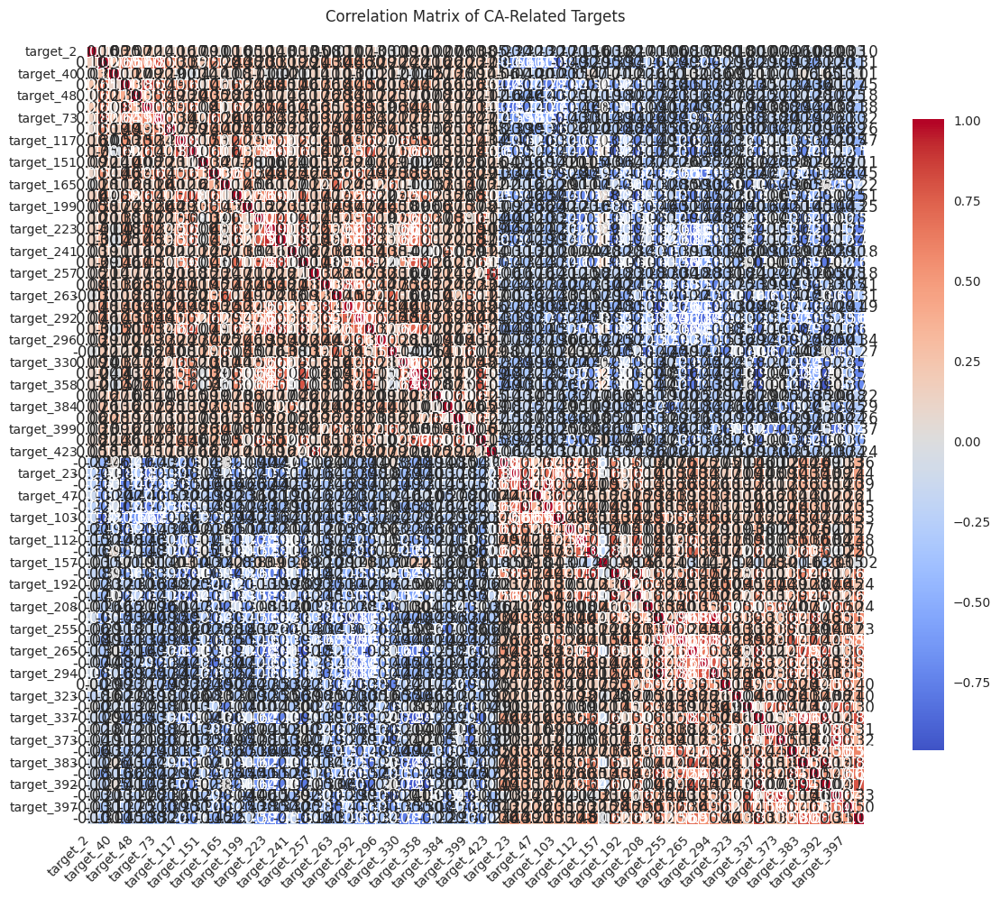

In [47]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Set up plot
plt.figure(figsize=(12, 10))
sns.set_style("white")

# Get CA-related targets
temp_CA1 = temp[temp['P1'] == 'CA']['target']
temp_CA2 = temp[temp['P2'] == 'CA']['target']
temp_CA = pd.concat([temp_CA1, temp_CA2])

print(f"CA as P1: {len(temp_CA1)} targets, CA as P2: {len(temp_CA2)} targets")

# Calculate correlation matrix
cormat_CA = labels[temp_CA].corr(method='pearson', min_periods=1)

# Create correlation heatmap
sns.heatmap(
    cormat_CA,
    cmap='coolwarm',
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={'shrink': 0.8},
    square=True
)

# Formatting
plt.title("Correlation Matrix of CA-Related Targets", pad=20)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<Figure size 1400x1200 with 0 Axes>

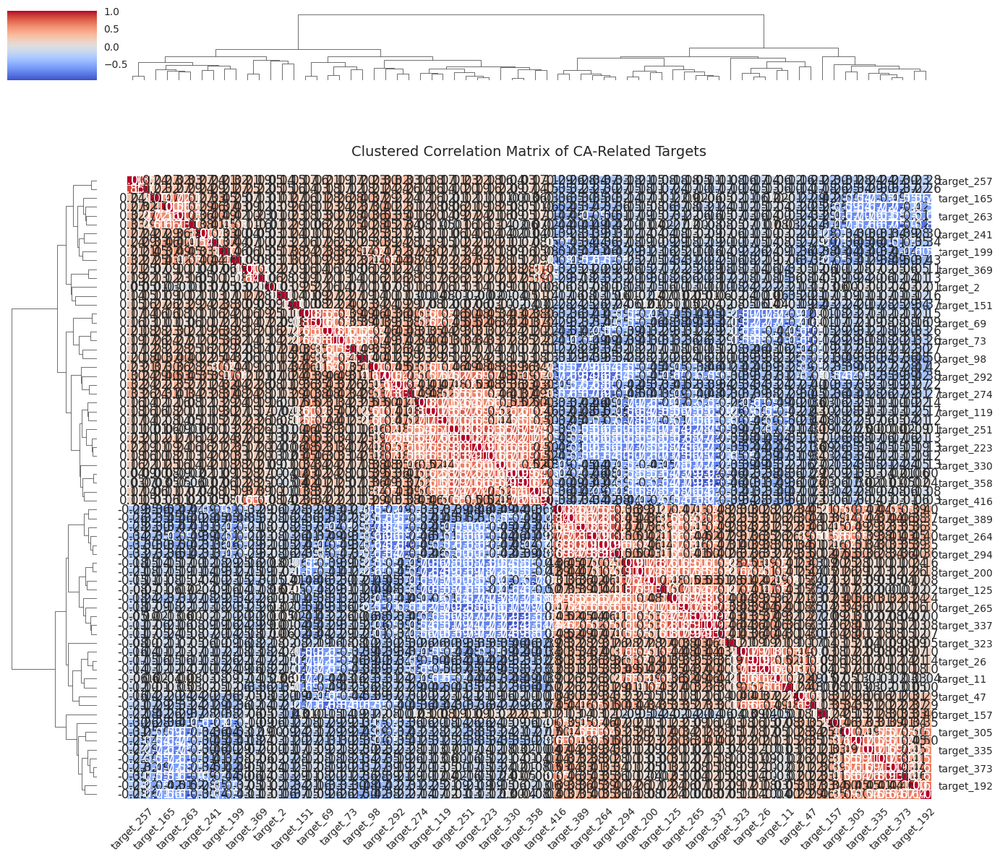

In [48]:
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Enhanced version with clustering and better annotations
plt.figure(figsize=(14, 12))

# Cluster correlations
g = sns.clustermap(
    cormat_CA,
    cmap='coolwarm',
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    figsize=(14, 12),
    dendrogram_ratio=0.1,
    cbar_pos=(0.02, 0.8, 0.05, 0.18)
)

# Formatting
g.ax_heatmap.set_title("Clustered Correlation Matrix of CA-Related Targets", 
                      pad=20, fontsize=14)
g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.tick_params(axis='x', rotation=45)
g.ax_heatmap.tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.show()

In [49]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

fig = px.imshow(
    cormat_CA,
    color_continuous_scale='RdBu',
    zmin=-1,
    zmax=1,
    title="CA Target Correlations"
)
fig.update_layout(width=800, height=800)
fig.show()